# Gross approximations of protein structures using contact maps
## Model xy-VAE : input sequence of amino-acids [0,1], output contact maps [0,1]

In [58]:
date = '20250427'

import pickle as pkl
import math
from scipy.spatial.distance import cdist
import time
import numpy as np
import matplotlib.pyplot as plt
import importlib, sys, os

import torch
import torch.nn.functional as F

import random
random.seed(42)

# Import Data

In [2]:
parent_folder = "nanos_networkx_small"
folders = [name for name in os.listdir(parent_folder) 
           if os.path.isdir(os.path.join(parent_folder, name))]

print(len(folders))

250


In [3]:
cwd = os.getcwd()
print(cwd)

/Users/laurofoletti/Documents/AML/P00_proteins/openmm


# Protein class definition

In [4]:
from classes.proteins import *

# Database generation

In [237]:
random.seed(42)

PROTEINS = Database()
SUBPROTEINS = Database()

chunk_length = 50

for folder in folders:
    filename = f"{cwd}/{parent_folder}/{folder}/{folder}{folder[-2:]}_atoms.pkl"
    with open(filename, 'rb') as f:
        data = pkl.load(f)
        protein = Protein(data)
        PROTEINS.append(protein)
        
        aas, cas, previous_aa = protein.explode(chunk_length)
        for i in range(len(aas)):
            subprotein = Protein(aas=aas[i], cas=cas[i], previous_aa=[previous_aa[i]])
            SUBPROTEINS.append(subprotein)

SUBPROTEINS.randomize

print (f"{SUBPROTEINS.len} items in full")
SUBPROTEINS = SUBPROTEINS[:10000]
print (f"{SUBPROTEINS.len} items in database")

17948 items in full
10000 items in database


# Contact maps definition (y data) and reconstruction test

In [244]:
all_distances = [protein.D for protein in SUBPROTEINS]
all_distances = np.array(all_distances)
all_distances = all_distances[all_distances != 0.]

# even distribution of contacts within the ranges, i suppose it will make the training better
n_ranges = 8
perc = np.percentile(all_distances, [100*i/n_ranges for i in range(n_ranges)]).tolist() + [all_distances.max().tolist()]
print ('Limits', perc)
print ('All distances', len(all_distances))

CONFIGS = []
for i in range(len(perc)-1):
    CONFIGS.append({'lower':perc[i], 'upper':perc[i+1]})

print (len(CONFIGS), 'configs in store.')
print (sum(all_distances>perc[-2]))

Limits [2.7835278871636264, 7.168076598059272, 10.732509154700283, 13.495427124710126, 15.90173844880455, 18.41358313019132, 21.326338836261897, 25.33887139036048, 66.53214641877118]
All distances 24500000
8 configs in store.
3062474


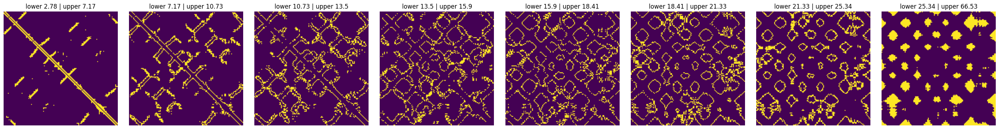

In [245]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

protein = PROTEINS[0]

cmaps = [protein.add_contact_map(config['lower'], config['upper'], False) for config in CONFIGS]
titles = [f"lower {round(config['lower'],2)} | upper {round(config['upper'],2)}" for config in CONFIGS]
compare_images(cmaps, titles, masking=False)

In [246]:
importlib.reload(sys.modules['functions.misc'])

from functions.misc import *

orig_cmap_recon_coords = reconstruct_coords_local_plural_maps(cmaps, CONFIGS, sharpness=15., window=25, 
                                                              dim=3, lr=1e-2, max_iter=5000, prints=10)

Gradient-based optimization based on multiple contact maps...
Step       0 | total loss:   106.5381 (['    4.1380', '    9.2682', '    8.9692', '    8.5726', '    8.8910', '   11.5657', '   17.6900', '   28.6443'])
Step     500 | total loss:    44.0853 (['    1.7768', '    4.6841', '    5.2941', '    5.9812', '    5.8670', '    6.0804', '    6.6386', '    7.6084'])
Step    1000 | total loss:    18.6859 (['    1.1562', '    1.7541', '    2.2032', '    2.7724', '    3.0538', '    3.1132', '    2.9252', '    1.6037'])
Step    1500 | total loss:     4.6008 (['    0.3564', '    0.3995', '    0.5928', '    0.6737', '    0.8471', '    0.7766', '    0.6461', '    0.2588'])
Step    2000 | total loss:     0.6613 (['    0.0472', '    0.0659', '    0.0711', '    0.0907', '    0.1258', '    0.1292', '    0.0947', '    0.0273'])
Step    2500 | total loss:     0.0928 (['    0.0034', '    0.0077', '    0.0131', '    0.0173', '    0.0160', '    0.0176', '    0.0126', '    0.0032'])
Step    3000 | total

In [247]:
if 'functions.graphics' in sys.modules: importlib.reload(sys.modules['functions.graphics'])
from functions.graphics import *

plotly_2_graphs([np.array(protein.ca), orig_cmap_recon_coords], 'Reconstruction test from true contact maps')

In [248]:
#importlib.reload(sys.modules['classes.VAE'])
importlib.reload(sys.modules['functions.misc'])

from functions.misc import *

for protein in PROTEINS:
    for config in CONFIGS:
        protein.add_contact_map(config['lower'], config['upper'], True)
    
for protein in SUBPROTEINS:
    for config in CONFIGS:
        protein.add_contact_map(config['lower'], config['upper'], True)

# Statistical lookup

In [249]:
# some useful stats

UNIQUE_AA = set()
for protein in PROTEINS:
    UNIQUE_AA.update(protein.aa)
UNIQUE_AA.update(['NUL'])
print(f"Unique amino acids in database : {len(UNIQUE_AA)}")

MAX_LEN = max([protein.len for protein in SUBPROTEINS])
print(f"Max protein length :             {MAX_LEN}")

all_vals = []
[all_vals.extend(val) for val in protein.ca for protein in SUBPROTEINS]
print(f"All single coords :              {len(all_vals)}")

MAX_Coord, MIN_Coord = max(all_vals), min(all_vals)
print(f"Max, min coords :                {MAX_Coord, MIN_Coord}")

Unique amino acids in database : 21
Max protein length :             50
All single coords :              3510000
Max, min coords :                (37.791, -117.688)


# Training data

In [250]:
AA_TRAINING_DATA = torch.stack([torch.tensor(protein.get_padded_aa(MAX_LEN, list(UNIQUE_AA)), dtype=torch.float32) for protein in SUBPROTEINS])
print ('AA training data           ', AA_TRAINING_DATA.shape)

CONTACT_TRAINING_DATA = torch.stack([torch.tensor(np.stack(protein.contact_maps, axis=-1), dtype=torch.float32) for protein in SUBPROTEINS])
print ('contact maps training data ', CONTACT_TRAINING_DATA.shape)

AA training data            torch.Size([10000, 50, 21])
contact maps training data  torch.Size([10000, 50, 50, 8])


In [251]:
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader as DL
from torch.utils.data import TensorDataset

class CustomDataset(TensorDataset):
    def __init__(self, data_input, data_output, transform=None):
        self.input = data_input
        self.output = data_output

    def __len__(self):
        return len(self.input)

    def __getitem__(self, idx):
        x = self.input[idx]
        y = self.output[idx]
        return x, y

def split_train_test(contact_map, SUBPROTEINS):
    temp_train =  contact_map[:int(SUBPROTEINS.len*0.9)]
    temp_test =   contact_map[int(SUBPROTEINS.len*0.9):]
    temp_train =  temp_train.view(temp_train.size(0),-1)
    temp_test =   temp_test.view(temp_test.size(0),-1)
    return (temp_train, temp_test)

def get_dataloader(train_x, train_y, batch_size=32):
    temp_dataset =     CustomDataset(train_x, train_y)
    temp_dataloader =  DL(temp_dataset, batch_size=BATCH_SIZE, shuffle=False)
    return temp_dataloader

BATCH_SIZE = 32

TRAIN_TEST_in =  split_train_test(AA_TRAINING_DATA, SUBPROTEINS)
TRAIN_TEST_out = split_train_test(CONTACT_TRAINING_DATA, SUBPROTEINS)
DATALOADERS =    [(get_dataloader(TRAIN_TEST_in[0], TRAIN_TEST_out[0], BATCH_SIZE), 
                   get_dataloader(TRAIN_TEST_in[1], TRAIN_TEST_out[1], BATCH_SIZE))]

print (len(DATALOADERS), len(DATALOADERS[0]))

1 2


# Model definition and training classes

In [252]:
if 'classes.testVAE' in sys.modules: importlib.reload(sys.modules['classes.testVAE'])
if 'functions.XY_training' in sys.modules: importlib.reload(sys.modules['functions.XY_training'])

from classes.testVAE import *
from functions.XY_training import *

# Hyperparameters and Training

In [253]:
code_size =     128
input_size =    TRAIN_TEST_in[0].shape[-1]
hidden_size =   128
output_size =   TRAIN_TEST_out[0].shape[-1]
channels =      len(CONFIGS)
epochs =        1000
lr =            1e-5
kl_sigma =      1e-5

print ('input_size ', input_size)
print ('output_size', output_size)
print ('')

input_size  1050
output_size 20000



In [254]:
Training_pool = []

for i in range(len(DATALOADERS)):
    
    model = XYVAE(input_size=input_size, hidden_size=hidden_size, code_size=code_size, output_size=output_size, channels=channels)
    optimizer = torch.optim.RMSprop(model.parameters(), lr=lr, alpha=0.99, momentum=0.9)
    model.apply(model.weights_init)
    
    Trainer = Training(name=f'XY-VAE {i}', model=model, optimizer=optimizer, with_kl=True)
    Training_pool .append(Trainer)

print (f'Training pool : about to train {len(Training_pool )} different models, this may require some time ...')

Training pool : about to train 1 different models, this may require some time ...


In [255]:
for i, dataloaders in enumerate(DATALOADERS):
    
    train_dl, test_dl = dataloaders
    Trainer = Training_pool[i]
    Trainer.train(train_dl, test_dl, kl_sig=kl_sigma, loss_type='MSE', epochs=1000, prints=100, verbose=False, loss_enlarge=1.)

    with open(f'models/{date}_trainer_{i}.pkl', 'wb') as f:
        pkl.dump(Trainer, f)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model XY-VAE 0
9000 training samples, 1000 test samples, 1000 epochs
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [     1/1000] Train KL-L:        24.74 | Train RECON-L:      2157.95 | Test KL-L:        24.25 | Test RECON-L:      2153.75
Epoch [    11/1000] Train KL-L:        41.65 | Train RECON-L:      1916.39 | Test KL-L:        46.30 | Test RECON-L:      1930.66
Epoch [    21/1000] Train KL-L:        48.98 | Train RECON-L:      1893.92 | Test KL-L:        47.82 | Test RECON-L:      1892.23
Epoch [    31/1000] Train KL-L:        38.31 | Train RECON-L:      1866.08 | Test KL-L:        37.57 | Test RECON-L:      1864.76
Epoch [    41/1000] Train KL-L:        36.98 | Train RECON-L:      1852.38 | Test KL-L:        37.37 | Test RECON-L:      1852.07
Epoch [    51/1000] Train KL-L:        41.35 | Train RECON-L:      1845.85 | Test KL-L:        41.52 | Test RE

# Evaluation

In [71]:
Training_pool = []
for i in range(len(CONFIGS)):
    try:
        with open(f'models/{date}_trainer_{i}.pkl', 'rb') as f:
            Training_pool.append(pkl.load(f))
    except:
        continue

In [256]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

[trainer.model.eval() for trainer in Training_pool]

loss_fn = torch.nn.MSELoss(reduction='sum')

def Recon(Trainer, sample_orig, sample_y):
    x = sample_orig
    y = sample_y
            
    mu, logvar = Trainer.model.encode(x)
    z = Trainer.model.reparameterize(mu, logvar)
    out = Trainer.model.decode(z)
            
    loss = loss_fn(out, y)
    score = loss.item()
    Dist_m = out.detach()    
        
    return (Dist_m, score)
    
def get_DB(idx):
    
    DB_GEN_learned = Database()

    folder = folders[idx]
    filename = f"{cwd}/{parent_folder}/{folder}/{folder}{folder[-2:]}_atoms.pkl"
    with open(filename, 'rb') as f:
        data = pkl.load(f)
        
    protein = Protein(data)
    for config in CONFIGS:
        protein.add_contact_map(config['lower'], config['upper'], True)
        
    aas, cas, previous_aa = protein.explode(chunk_length)
    for i in range(len(aas)):
        subprotein = Protein(aas=aas[i], cas=cas[i], previous_aa=[previous_aa[i]])
        for config in CONFIGS:
            subprotein.add_contact_map(config['lower'], config['upper'], True)
        DB_GEN_learned.append(subprotein)
    
    DB_GEN_learned = DB_GEN_learned[:20000]
    print (f"Original protein length", protein.len)
    print (f"{DB_GEN_learned.len} subsequences")
    
    return (DB_GEN_learned, protein)

def get_training_sets(data, idx=0):

    AA_train = torch.stack([torch.tensor(protein.get_padded_aa(chunk_length, list(UNIQUE_AA)), dtype=torch.float32) for protein in data])
    CM_train = torch.stack([torch.tensor(np.stack(protein.contact_maps, axis=-1), dtype=torch.float32) for protein in data])
    print ('contact maps training data ', CM_train.shape)

    TRAIN_x =    AA_train
    TRAIN_out =  CM_train
    TRAIN_x =    TRAIN_x.view(TRAIN_x.size(0),-1)
    TRAIN_out =  TRAIN_out.view(TRAIN_out.size(0),-1)
    
    return (TRAIN_x, TRAIN_out)

def get_protein_average_contact(Dist_m, protein):

    protein_DM = np.zeros((protein.len, protein.len))
    divider_DM =  np.zeros((protein.len, protein.len))
    hard_mask = np.zeros((protein.len, protein.len)).astype(bool)
    
    for i in range(len(Dist_m)):
        Dist_matrix = Dist_m[i].view(chunk_length,chunk_length).detach().numpy()
        protein_DM[i:i+chunk_length, i:i+chunk_length] += Dist_matrix
        divider_DM[i:i+chunk_length, i:i+chunk_length] += 1.
        hard_mask[i:i+chunk_length, i:i+chunk_length] = 1
    
    divider_DM[divider_DM == 0.] = 1.
    protein_DM /= divider_DM

    return (protein_DM, hard_mask)

Original protein length 133
83 subsequences
contact maps training data  torch.Size([83, 50, 50, 8])
torch.Size([83, 20000])
torch.Size([83, 50, 50, 8])


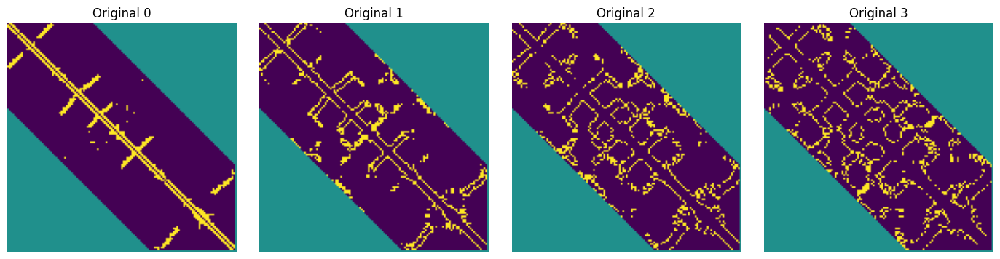

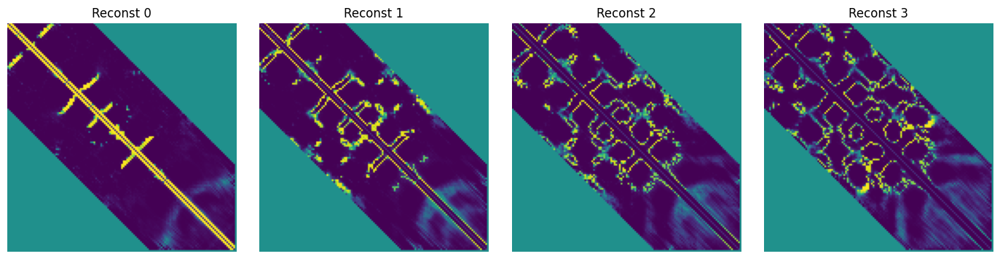

In [259]:
results = []

for idx in [0]:
    
    data, protein = get_DB(idx)

    trainer = Training_pool[0]
    TRAIN_x, TRAIN_out = get_training_sets(data, idx=0)
    Contact_map, scores = Recon(trainer, TRAIN_x, TRAIN_out)
    print (Contact_map.shape)
    Contact_map = Contact_map.reshape(Contact_map.shape[0], chunk_length, chunk_length, len(CONFIGS))
    print (Contact_map.shape)
    
    contact_maps, hard_masks = [], []
    for i in range(len(CONFIGS)):
        recon_average_contact, hard_mask = get_protein_average_contact(Contact_map[:,:,:,i].squeeze(), protein)
        contact_maps.append(recon_average_contact)
        hard_masks.append(hard_mask)

    item = [protein, hard_mask] + contact_maps
    results.append(item)

compare_images(results[0][0].contact_maps[:4], [f'Original {i}' for i in range(4)], masking=True, mask=hard_mask)
compare_images(results[0][2:6], [f'Reconst {i}' for i in range(4)], masking=True, mask=hard_mask)


# Reconstructions

In [260]:
def sharpen(x, temperature=0.01):
    x = np.array(x)
    e_x = np.exp(x / temperature)
    return e_x / np.sum(e_x, axis=-1, keepdims=True)
    
def symmetrize(contact_map):
    symmetrical = np.maximum(contact_map, contact_map.T)
    return symmetrical

def regularize(contact_maps):
    stacked = np.stack(contact_maps, axis=2)
    stacked_sharp = np.round(sharpen(stacked))
    regularized = [stacked_sharp[:,:,i] for i in range(len(contact_maps))]
    [np.fill_diagonal(arr, 0) for arr in regularized]
    return regularized

In [ ]:
importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

recon_contact_maps = results[0][2:]
recon_contact_maps = [symmetrize(contact_map) for contact_map in recon_contact_maps]
recon_contact_maps = regularize(recon_contact_maps)

recon_cmap_recon_coords = reconstruct_coords_local_plural_maps(recon_contact_maps, 
                                                               CONFIGS, sharpness=15.,
                                                               window=25, dim=3, lr=1e-2, max_iter=10000, prints=10)

original_contact_maps = results[0][0].contact_maps
orig_cmap_recon_coords = reconstruct_coords_local_plural_maps(original_contact_maps, 
                                                              CONFIGS, sharpness=15.,
                                                              window=25, dim=3, lr=1e-2, max_iter=10000, prints=10)

Gradient-based optimization based on multiple contact maps...
Step       0 | total loss:   161.37 (['    4.38', '   13.75', '   12.84', '   12.47', '   15.03', '   20.60', '   28.73', '   41.87'])
Step    1000 | total loss:    50.32 (['    2.38', '    5.21', '    6.41', '    5.18', '    5.78', '    7.22', '    8.81', '    9.15'])
Step    2000 | total loss:    31.01 (['    1.79', '    3.38', '    4.92', '    3.55', '    3.70', '    3.90', '    5.05', '    4.67'])
Step    3000 | total loss:    20.30 (['    2.34', '    1.88', '    1.98', '    1.97', '    2.38', '    2.47', '    3.07', '    4.19'])
Step    4000 | total loss:    19.47 (['    2.14', '    1.64', '    1.69', '    1.83', '    2.28', '    2.47', '    3.08', '    4.30'])
Step    5000 | total loss:    19.08 (['    1.82', '    1.52', '    1.52', '    1.82', '    2.24', '    2.54', '    3.24', '    4.37'])
Step    6000 | total loss:    19.04 (['    1.73', '    1.50', '    1.50', '    1.83', '    2.25', '    2.54', '    3.24', '    4

In [190]:
with open('test_coords.pkl', 'wb') as f:
    data = {'recon': recon_cmap_recon_coords, 'orig': orig_cmap_recon_coords}
    pkl.dump(data, f)

In [262]:
importlib.reload(sys.modules['functions.graphics'])

from functions.graphics import *

plotly_2_graphs([np.array(results[0][0].ca), orig_cmap_recon_coords], 'Reconstruction from true contact maps')
plotly_2_graphs([np.array(results[0][0].ca), recon_cmap_recon_coords], 'Reconstruction from reconstructed contact map')